# Clusterization challenge

## Setting the paths, importing the libraries and the data

In [24]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from plotly.offline import iplot


notebook = 'clusterization.ipnyb'
path = os.path.dirname(os.path.abspath(notebook))+'/data/'
clusterization_path = path+'clusterization.csv'


clusterization = pd.read_csv(clusterization_path)

clusterization.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9
0,1.788532,1.514571,1.965787,1.788532,1.839011,0.027213,4.287439,1.103957,0.272501,0.390037
1,1.137568,-0.537787,0.405860,1.137568,1.177157,0.881743,2.289545,-0.427406,-0.227506,0.452705
2,0.861253,2.133148,-1.285062,0.861253,1.654487,0.104453,-0.858607,0.455393,-1.066773,-0.382173
3,1.630619,-0.000408,0.688288,1.630619,2.688988,2.321262,1.977060,0.234256,-1.424967,-0.864576
4,2.339800,-3.593987,-4.507650,2.339800,-3.642843,0.772287,2.938295,1.424821,-0.171201,4.652432


## Setting the seeds for reproducibility

In [2]:
import random 

seed_value = 42
random.seed(seed_value) 
np.random.seed(seed_value)

## Exploratory analysis

There is little info about this data but we can still explore it a little bit:
* null/missing values
* variables distribution
* variable correlation
* distribution according to the target variable

In [3]:
#Constructing a clusterizationframe with the variable types and missing values per column
consistency = pd.DataFrame({'columns' : clusterization.columns,
                    'type': clusterization.dtypes,
                    'missing' : clusterization.isna().sum(),
                    'size' : clusterization.shape[0],
                    'unique': clusterization.nunique()})
consistency['percentage'] = round(consistency['missing'] / consistency['size'],2)
consistency

,columns,type,missing,size,unique,percentage
x0,x0,float64,0,15000,15000,0.0
x1,x1,float64,0,15000,15000,0.0
x2,x2,float64,0,15000,15000,0.0
x3,x3,float64,0,15000,15000,0.0
x4,x4,float64,0,15000,15000,0.0
x5,x5,float64,0,15000,15000,0.0
x6,x6,float64,0,15000,15000,0.0
x7,x7,float64,0,15000,15000,0.0
x8,x8,float64,0,15000,15000,0.0
x9,x9,float64,0,15000,15000,0.0


There are no missing values, and every feature is a float type feature.

In [4]:
clusterization.max()

x0     6.389245
x1    10.448874
x2    12.617171
x3     6.389245
x4     9.729344
x5     9.415774
x6     7.171006
x7     7.421327
x8     7.266332
x9     6.640401
dtype: float64

In [5]:
clusterization.min()

x0   -6.181360
x1   -9.204687
x2   -8.180204
x3   -6.181360
x4   -5.413946
x5   -7.579985
x6   -5.455328
x7   -6.329266
x8   -4.985370
x9   -6.206228
dtype: float64

Furthermore there aren't obvious outliers and every feature is within the same scale.

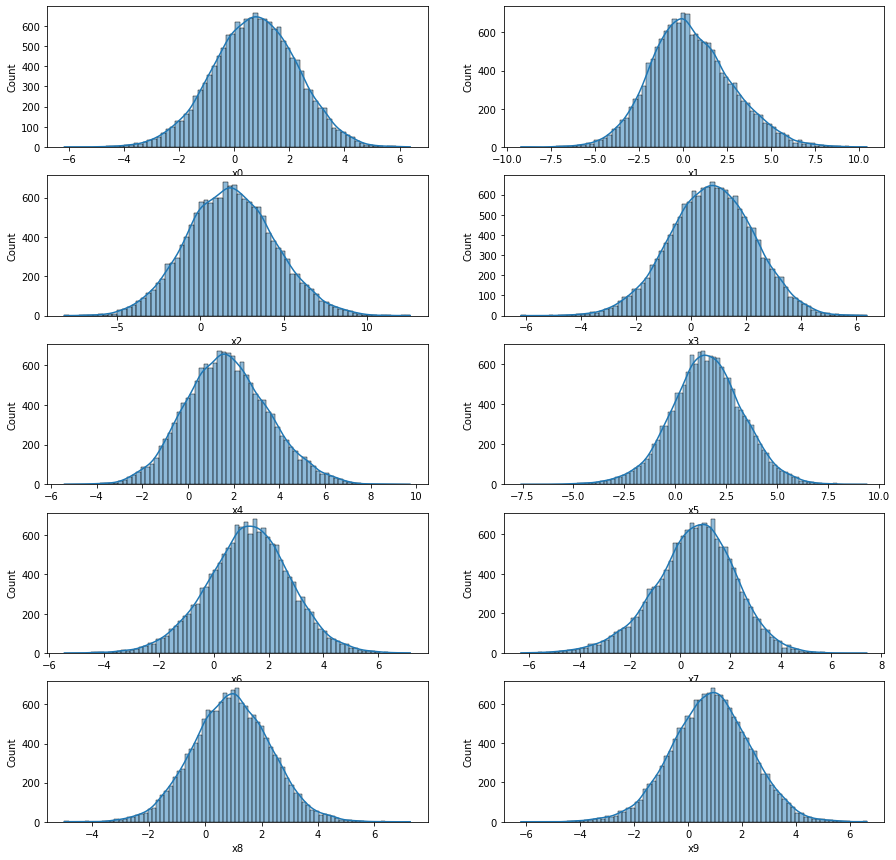

In [7]:
fig, ax = plt.subplots(5, 2, figsize=(15, 15))
for variable, subplot in zip(clusterization.columns, ax.flatten()):
    sns.histplot(clusterization[variable], ax=subplot,kde=True)

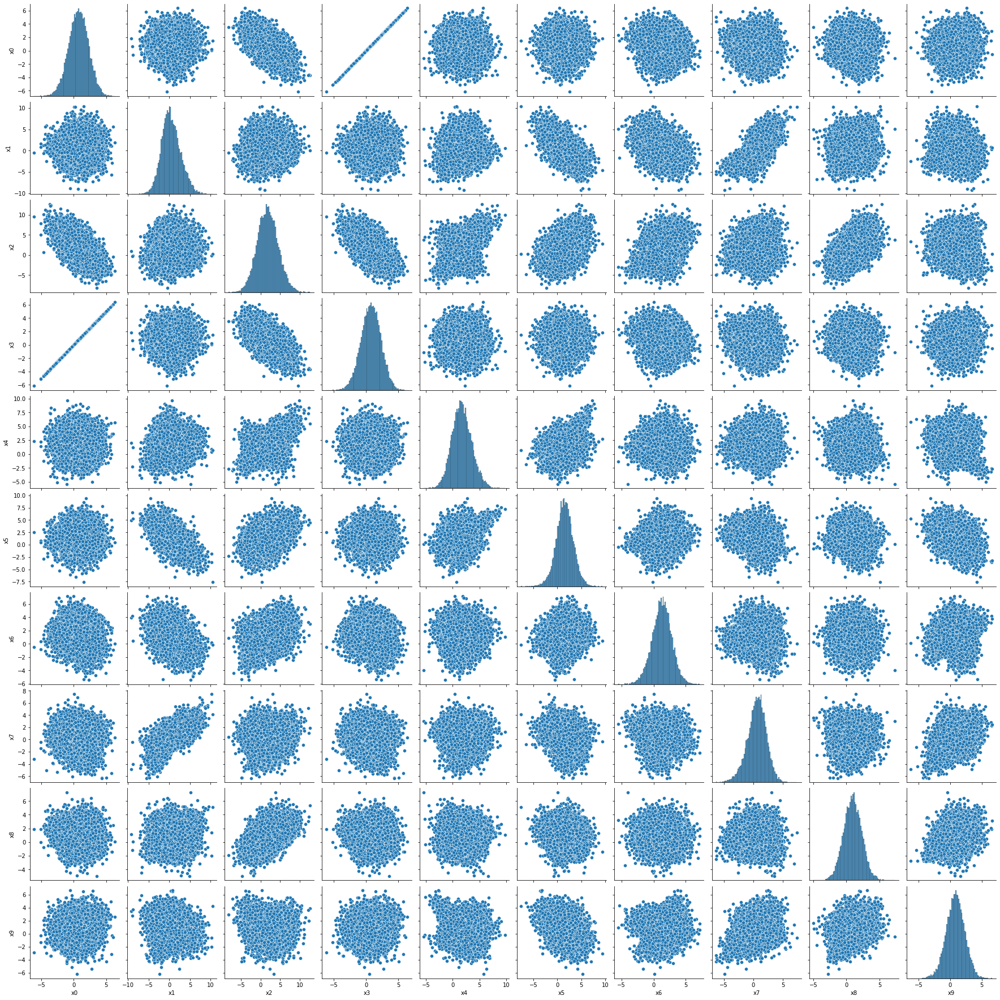

In [8]:
sns.pairplot(clusterization, kind="scatter")
plt.show()

We can see that X1, X2, and X7 have a linear positive relationship with the target variable. So the hypothesis arises that these are the most relevant features.

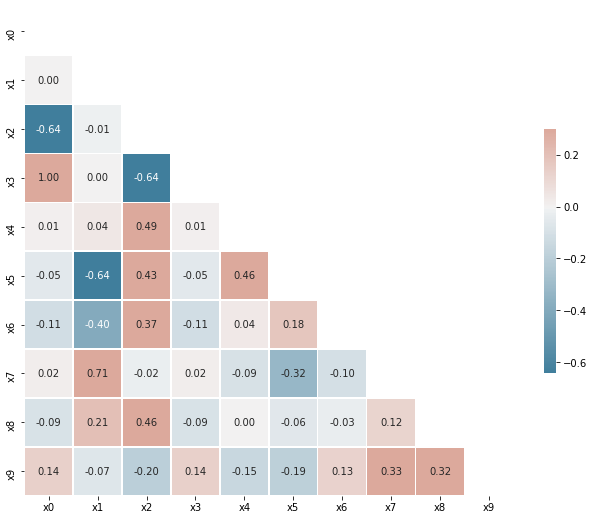

In [9]:
# Compute the correlation matrix
corr = clusterization.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True, fmt='.2f',
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

In [15]:
factor = clusterization['x0']/clusterization['x3']
factor.value_counts()

1.0    15000
dtype: int64

x0 and x3 are the exact same feature (or at the very least represent two features with the exact same numbers which is very unlikely), so there is no need to keep both. We'll drop x3.

In [16]:
clusterization_cleaned = clusterization.loc[:,clusterization.columns != 'x3']

clusterization_cleaned

,x0,x1,x2,x4,x5,x6,x7,x8,x9
0,1.788532,1.514571,1.965787,1.839011,0.027213,4.287439,1.103957,0.272501,0.390037
1,1.137568,-0.537787,0.405860,1.177157,0.881743,2.289545,-0.427406,-0.227506,0.452705
2,0.861253,2.133148,-1.285062,1.654487,0.104453,-0.858607,0.455393,-1.066773,-0.382173
3,1.630619,-0.000408,0.688288,2.688988,2.321262,1.977060,0.234256,-1.424967,-0.864576
4,2.339800,-3.593987,-4.507650,-3.642843,0.772287,2.938295,1.424821,-0.171201,4.652432
...,...,...,...,...,...,...,...,...,...
14995,1.399420,5.092977,0.402883,2.863799,-0.081778,-0.877357,2.859377,0.268572,0.188148
14996,0.649923,0.417965,3.482551,1.591363,1.302598,3.265006,0.253190,1.130115,-0.031375
14997,1.118290,0.493511,1.207282,0.554738,1.299356,0.563081,0.672465,2.043012,1.428598
14998,-1.097511,2.685838,2.717920,2.310047,1.457397,1.477649,2.587867,-1.756888,-0.975406


We are going to use UMAP, a dimension reduction algorithm, to look at all the data distribution graphically.
We'll start with 3D plots and move to 2D.

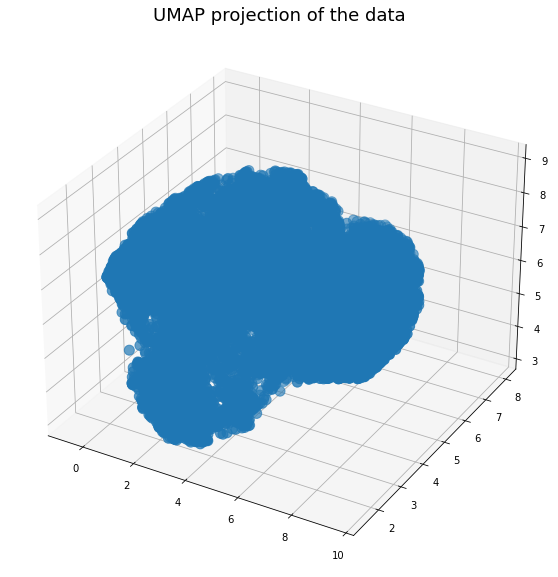

In [18]:
import umap as umap

def draw_umap(data, n_neighbors, min_dist, n_components, title, metric='euclidean'):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(data);
    fig = plt.figure(figsize=(24,10))
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)))
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1])
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], s=100)
    plt.title(title, fontsize=18)
    
title = 'UMAP projection of the data'    
draw_umap(clusterization_cleaned,14,0.1,3,title)

All these parameters are based on the documentation if you want more details about them you can visit its site [here](https://umap-learn.readthedocs.io/en/latest/parameters.html). 

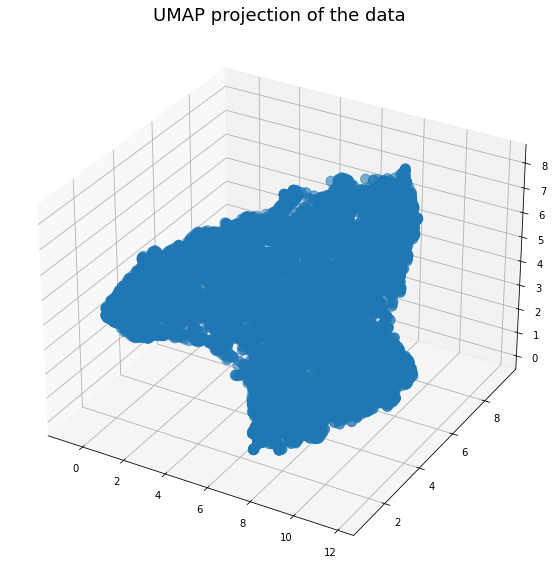

In [19]:
#low n_neighbours focus more on local distribution
draw_umap(clusterization_cleaned,5,0.1,3,title)

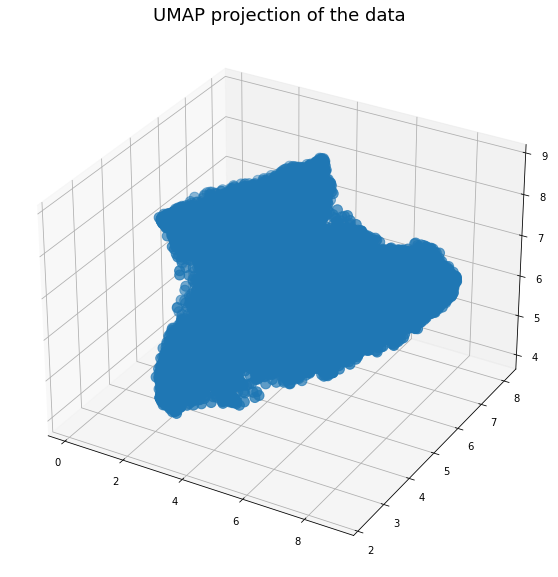

In [20]:
#high n_neighbours focus more on global distribution
draw_umap(clusterization_cleaned,50,0.1,3,title)

The 3D plot isn't very revealing. Let's move on to the 2D.

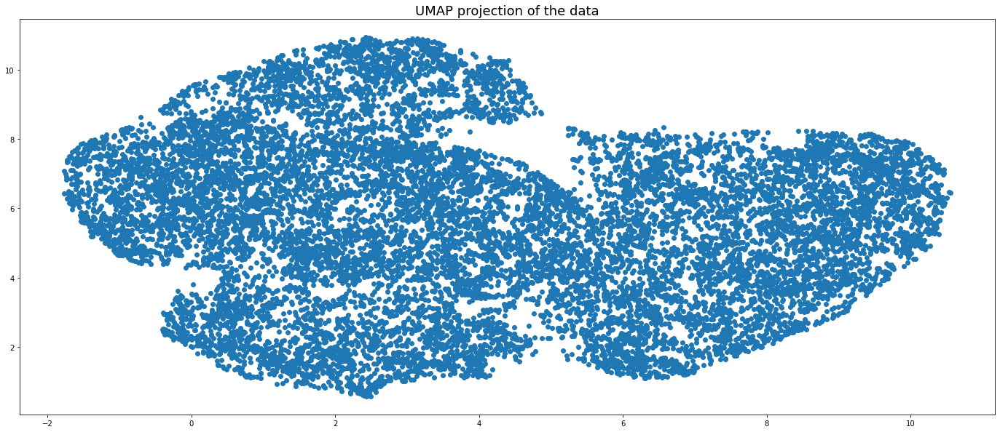

In [21]:
draw_umap(clusterization_cleaned,14,0.1,2,title)

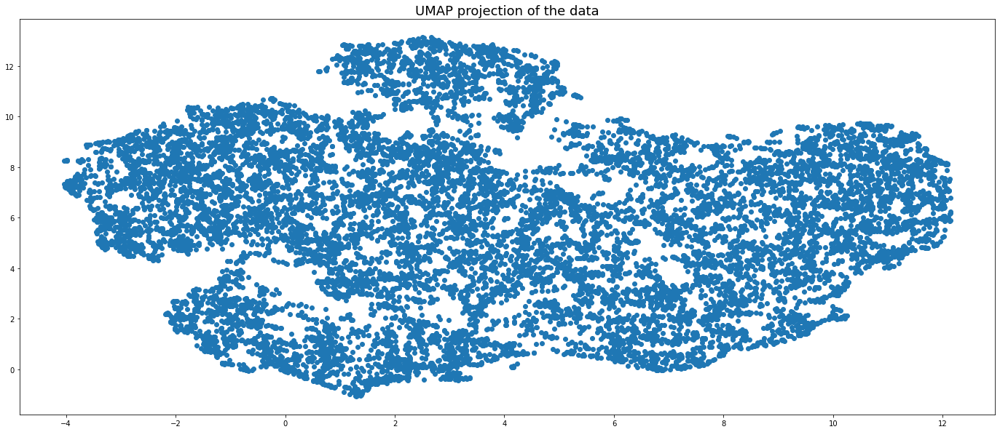

In [22]:
draw_umap(clusterization_cleaned,5,0.1,2,title)

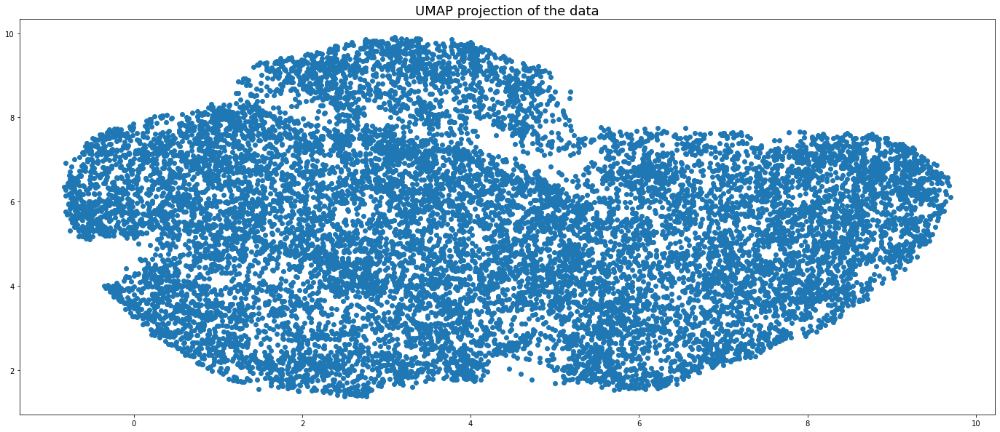

In [23]:
draw_umap(clusterization_cleaned,50,0.1,2,title)

With a 2D plot we could likely guess that the best numbers of clusters for this data is somewhere between 4 and 6.

But for now it's just an hypothesis.

## Model training and evaluation

Let's start with K-means since the eucledian distance is a good fit for this data and apparently there aren't obvious outliers.

Firstly we need to try to determine the optimal number of clusters, and the metrics to do achieve that have been already set in the challenge:
* elbow method, 
* silhouette score, 
* calinski-harabasz,
* and davies-bouldin.

In [26]:
from sklearn.cluster import KMeans

wss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = seed_value)
    kmeans.fit(clusterization_cleaned)
    wss.append(kmeans.inertia_)

fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(1, 11)), y=wss, name='elbow', mode='lines'))

fig.update_layout(title='The Elbow Method', 
                  xaxis={"title": "Number of clusters"},
                  yaxis={"title": "Within Sum of Squares"})

fig.show()

For n_clusters = 2 The average silhouette_score is : 0.20970697541605327
For n_clusters = 3 The average silhouette_score is : 0.1961446493928868
For n_clusters = 4 The average silhouette_score is : 0.16923322726102508
For n_clusters = 5 The average silhouette_score is : 0.15238779724925644
For n_clusters = 6 The average silhouette_score is : 0.14693179151454044
For n_clusters = 7 The average silhouette_score is : 0.13833730926456902
For n_clusters = 8 The average silhouette_score is : 0.13912271238888654
For n_clusters = 9 The average silhouette_score is : 0.13537446361607922
For n_clusters = 10 The average silhouette_score is : 0.13267636380849113


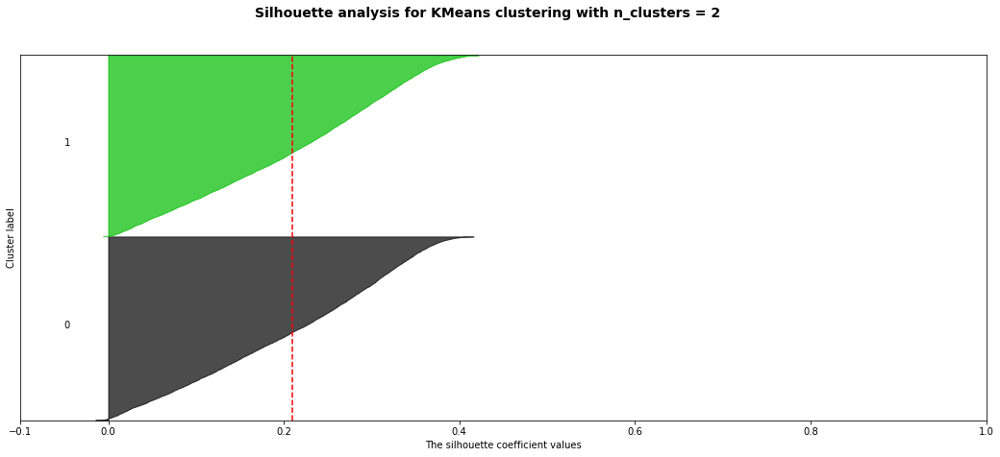

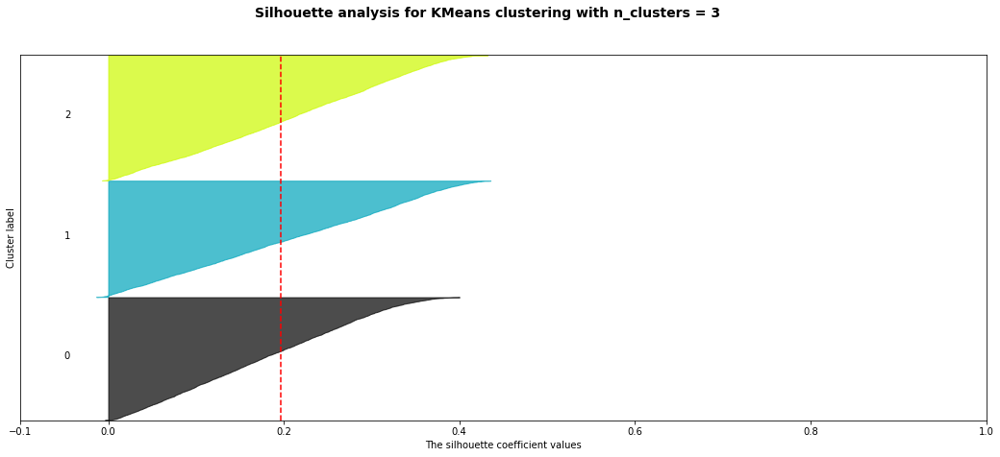

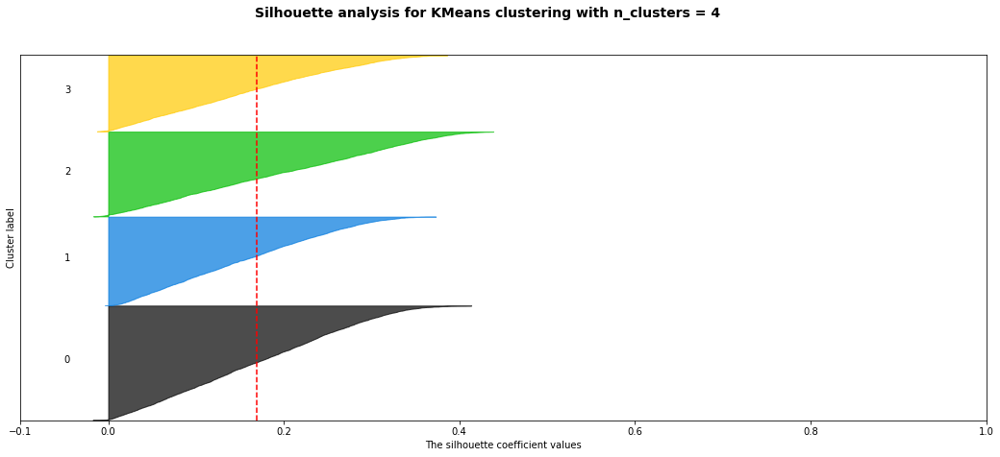

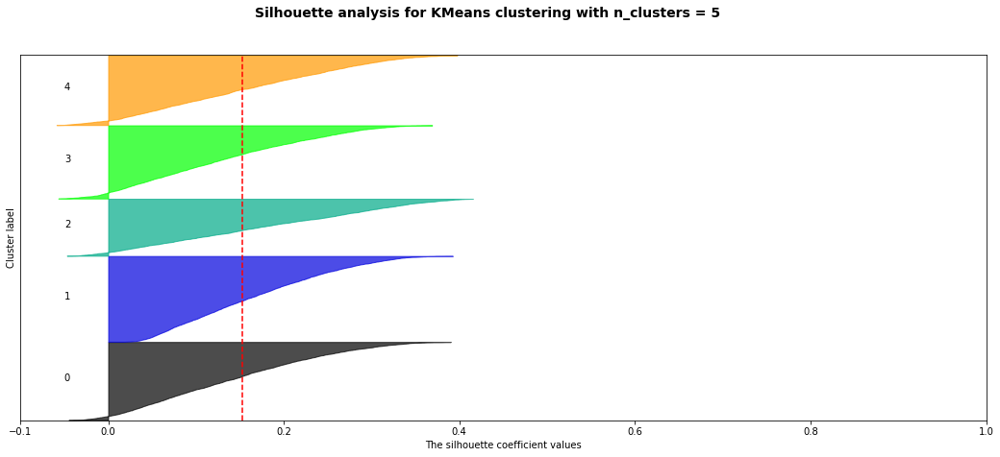

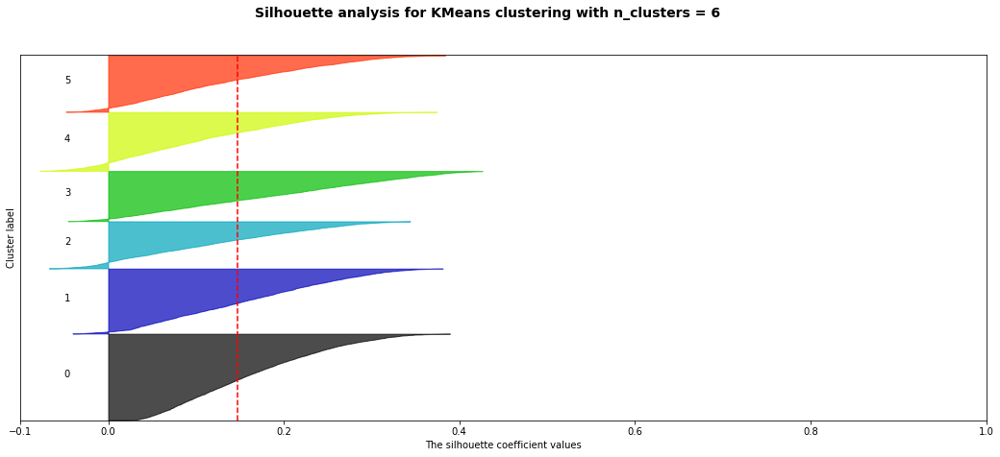

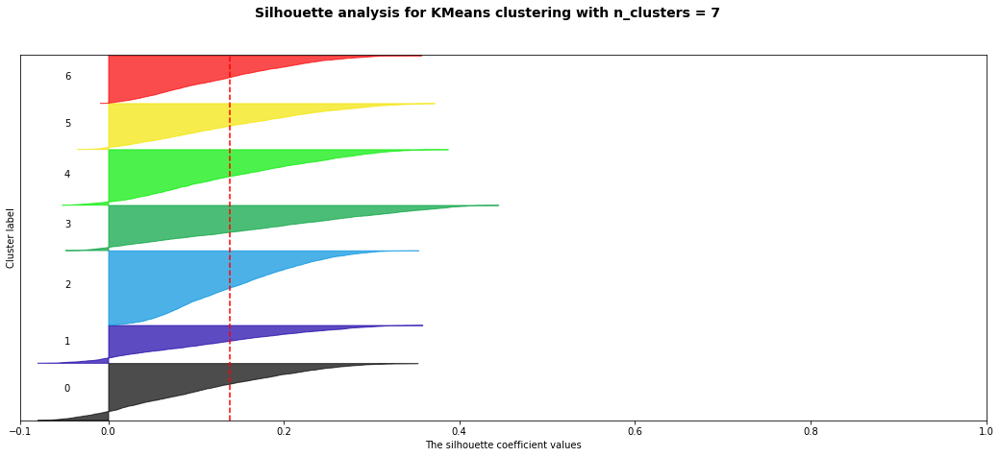

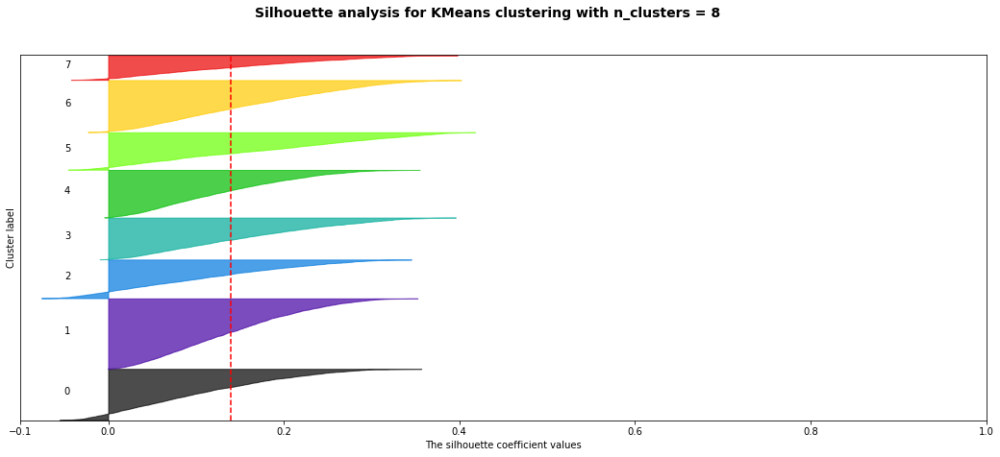

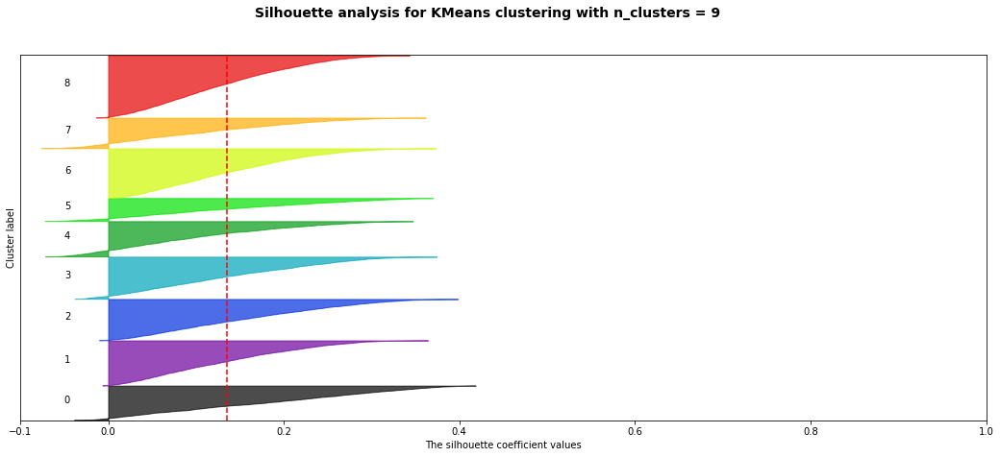

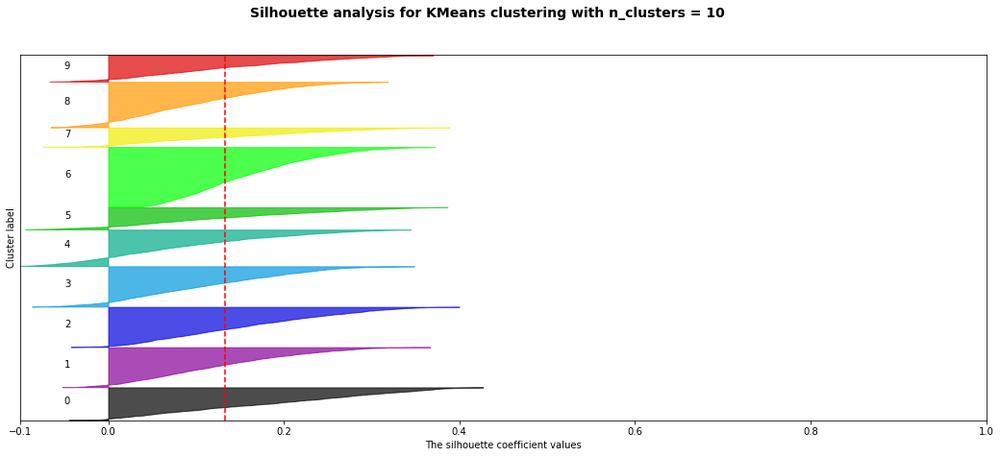

In [49]:
from sklearn.metrics import silhouette_samples, silhouette_score


range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 1 columns
    fig, (ax1) = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(clusterization_cleaned) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, init = 'k-means++', random_state=seed_value)
    cluster_labels = clusterer.fit_predict(clusterization_cleaned)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(clusterization_cleaned, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(clusterization_cleaned, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    

    plt.suptitle(("Silhouette analysis for KMeans clustering "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

The Silhouette Coefficient is bounded between -1 for incorrect clustering and +1 for highly dense clustering.
Scores around zero indicate overlapping clusters.

The Calinski-Harabasz score is higher when clusters are dense and well separated.

The Davies-Bouldin Zero score is the lowest possible score. Values closer to zero indicate a better partition.

This information was taken from scikit-learn [documentation](https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation).

In [55]:
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

for i in range (2,11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = seed_value).fit(clusterization_cleaned)
    labels = kmeans.labels_
    calinski = calinski_harabasz_score(clusterization_cleaned, labels)
    davies = davies_bouldin_score(clusterization_cleaned, labels)
    print('The Calinski-Harabasz Index for {0} clusters is: {1}.'
          .format(i, "%.2f" % calinski))
    print('The Davies-Bouldin Index for {0} clusters is: {1}.\n'
          .format(i, "%.2f" % davies))

The Calinski-Harabasz Index for 2 clusters is: 4592.44.
The Davies-Bouldin Index for 2 clusters is: 1.70.

The Calinski-Harabasz Index for 3 clusters is: 4254.93.
The Davies-Bouldin Index for 3 clusters is: 1.55.

The Calinski-Harabasz Index for 4 clusters is: 3599.39.
The Davies-Bouldin Index for 4 clusters is: 1.60.

The Calinski-Harabasz Index for 5 clusters is: 3214.78.
The Davies-Bouldin Index for 5 clusters is: 1.59.

The Calinski-Harabasz Index for 6 clusters is: 2913.17.
The Davies-Bouldin Index for 6 clusters is: 1.65.

The Calinski-Harabasz Index for 7 clusters is: 2643.01.
The Davies-Bouldin Index for 7 clusters is: 1.68.

The Calinski-Harabasz Index for 8 clusters is: 2456.57.
The Davies-Bouldin Index for 8 clusters is: 1.68.

The Calinski-Harabasz Index for 9 clusters is: 2309.56.
The Davies-Bouldin Index for 9 clusters is: 1.69.

The Calinski-Harabasz Index for 10 clusters is: 2174.82.
The Davies-Bouldin Index for 10 clusters is: 1.65.



The Silhouette Coefficient and Calinski-Harabasz Index are better for 2 clusters:
* Silhouette Coefficient: 0.2097,
* Calinski-Harabasz: 4592.44
* Davies-Bouldin: 1.70

While Davies-Bouldin Index is better for 3 clusters:
* Davies-Bouldin: 1.55,
* Silhouette Coefficient: 0.1961,
* Calinski-Harabasz: 4254.93

Whereas the Elbow method indicates that the inflection is somewhere between 3 and 4.

We can apply UMAP and plot the data with 2, 3 and 4 clusters to see try to get a better understanding of the differences between these numbers of clusters.

## 2 clusters

In [57]:
fit = umap.UMAP(
        n_neighbors=15,
        min_dist=0.1,
        n_components=3,
        metric='euclidean'
    )

X = fit.fit_transform(clusterization_cleaned)



number_clusters = 2
kmeans = KMeans(n_clusters = number_clusters, init = 'k-means++', random_state = seed_value)
y_kmeans = kmeans.fit_predict(X)



# Visualising the clusters

fig = go.Figure()

fig.add_trace(go.Scatter3d(x=X[y_kmeans == 0, 0], y=X[y_kmeans == 0, 1], z=X[y_kmeans == 0, 2], name='Cluster 1', mode='markers'))
fig.add_trace(go.Scatter3d(x=X[y_kmeans == 1, 0], y=X[y_kmeans == 1, 1], z=X[y_kmeans == 0, 2], name='Cluster 2', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 2, 0], y=X[y_kmeans == 2, 1], z=X[y_kmeans == 0, 2], name='Cluster 3', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 3, 0], y=X[y_kmeans == 3, 1], z=X[y_kmeans == 0, 2], name='Cluster 4', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 4, 0], y=X[y_kmeans == 4, 1], z=X[y_kmeans == 0, 2], name='Cluster 5', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 5, 0], y=X[y_kmeans == 5, 1], z=X[y_kmeans == 0, 2], name='Cluster 6', mode='markers'))
#fig.add_trace(go.Scatter(x=X[y_kmeans == 6, 0], y=X[y_kmeans == 6, 1], name='Cluster 7', mode='markers'))#comment the lines if you chose less clusters
#add more lines if you chose more clusters

fig.add_trace(go.Scatter3d(x=kmeans.cluster_centers_[:, 0], y=kmeans.cluster_centers_[:, 1],z=kmeans.cluster_centers_[:, 2], name='Centroids', 
                         mode='markers', marker_color="rgb(255,255,0)", marker=dict(size=16)))

fig.update_layout(title='Clusters')

fig.show()

# 3 clusters

In [60]:
fit = umap.UMAP(
        n_neighbors=15,
        min_dist=0.1,
        n_components=3,
        metric='euclidean'
    )

X = fit.fit_transform(clusterization_cleaned)



number_clusters = 3
kmeans = KMeans(n_clusters = number_clusters, init = 'k-means++', random_state = seed_value)
y_kmeans = kmeans.fit_predict(X)



# Visualising the clusters

fig = go.Figure()

fig.add_trace(go.Scatter3d(x=X[y_kmeans == 0, 0], y=X[y_kmeans == 0, 1], z=X[y_kmeans == 0, 2], name='Cluster 1', mode='markers'))
fig.add_trace(go.Scatter3d(x=X[y_kmeans == 1, 0], y=X[y_kmeans == 1, 1], z=X[y_kmeans == 0, 2], name='Cluster 2', mode='markers'))
fig.add_trace(go.Scatter3d(x=X[y_kmeans == 2, 0], y=X[y_kmeans == 2, 1], z=X[y_kmeans == 0, 2], name='Cluster 3', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 3, 0], y=X[y_kmeans == 3, 1], z=X[y_kmeans == 0, 2], name='Cluster 4', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 4, 0], y=X[y_kmeans == 4, 1], z=X[y_kmeans == 0, 2], name='Cluster 5', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 5, 0], y=X[y_kmeans == 5, 1], z=X[y_kmeans == 0, 2], name='Cluster 6', mode='markers'))
#fig.add_trace(go.Scatter(x=X[y_kmeans == 6, 0], y=X[y_kmeans == 6, 1], name='Cluster 7', mode='markers'))#comment the lines if you chose less clusters
#add more lines if you chose more clusters

fig.add_trace(go.Scatter3d(x=kmeans.cluster_centers_[:, 0], y=kmeans.cluster_centers_[:, 1],z=kmeans.cluster_centers_[:, 2], name='Centroids', 
                         mode='markers', marker_color="rgb(255,255,0)", marker=dict(size=16)))

fig.update_layout(title='Clusters')

fig.show()

# 4 clusters

In [62]:
fit = umap.UMAP(
        n_neighbors=15,
        min_dist=0.1,
        n_components=3,
        metric='euclidean'
    )

X = fit.fit_transform(clusterization_cleaned)



number_clusters = 4
kmeans = KMeans(n_clusters = number_clusters, init = 'k-means++', random_state = seed_value)
y_kmeans = kmeans.fit_predict(X)



# Visualising the clusters

fig = go.Figure()

fig.add_trace(go.Scatter3d(x=X[y_kmeans == 0, 0], y=X[y_kmeans == 0, 1], z=X[y_kmeans == 0, 2], name='Cluster 1', mode='markers'))
fig.add_trace(go.Scatter3d(x=X[y_kmeans == 1, 0], y=X[y_kmeans == 1, 1], z=X[y_kmeans == 0, 2], name='Cluster 2', mode='markers'))
fig.add_trace(go.Scatter3d(x=X[y_kmeans == 2, 0], y=X[y_kmeans == 2, 1], z=X[y_kmeans == 0, 2], name='Cluster 3', mode='markers'))
fig.add_trace(go.Scatter3d(x=X[y_kmeans == 3, 0], y=X[y_kmeans == 3, 1], z=X[y_kmeans == 0, 2], name='Cluster 4', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 4, 0], y=X[y_kmeans == 4, 1], z=X[y_kmeans == 0, 2], name='Cluster 5', mode='markers'))
#fig.add_trace(go.Scatter3d(x=X[y_kmeans == 5, 0], y=X[y_kmeans == 5, 1], z=X[y_kmeans == 0, 2], name='Cluster 6', mode='markers'))
#fig.add_trace(go.Scatter(x=X[y_kmeans == 6, 0], y=X[y_kmeans == 6, 1], name='Cluster 7', mode='markers'))#comment the lines if you chose less clusters
#add more lines if you chose more clusters

fig.add_trace(go.Scatter3d(x=kmeans.cluster_centers_[:, 0], y=kmeans.cluster_centers_[:, 1],z=kmeans.cluster_centers_[:, 2], name='Centroids', 
                         mode='markers', marker_color="rgb(255,255,0)", marker=dict(size=16)))

fig.update_layout(title='Clusters')

fig.show()

## Conclusion

Setting the ideal number of clusters is always subjective, specially when we don't know the goal of the clusterization.

So I when I look strictly at the numbers and the plots I would advance with only 2 clusters.

However we can see that one region is clearly defined regardless of the amount of clusters, so we could explore other clustering algorithms to see if the remaining region would be divided better.

Alternatively, we could explore other distance metrics or even both simultaneously. 